## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.

* **To be submitted by next session**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!

* NB: if `PIL` is not installed, try `conda install pillow`.


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pickle
import urllib.request
import cv2
import os

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [2]:
resn = models.resnet34(pretrained=True)
resn.eval(); # set the model to evaluation mode

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)

In [3]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl') )

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [5]:
def preprocess(image_path):
    raw_image = cv2.imread(image_path)
    raw_image = cv2.resize(raw_image, (224,) * 2)
    image = transforms.Compose([
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])(raw_image[..., ::-1].copy())
    return image, raw_image

def load_images(image_paths):
    images = []
    raw_images = []
    for i, filename in enumerate(os.listdir(image_paths)):
      if filename.endswith(".jpg"):
        image, raw_image = preprocess(image_paths + filename)
        images.append(image)
        raw_images.append(raw_image)
    return images, raw_images

# Images
images, raw_images = load_images("data/TP2_images/")
images = torch.stack(images)

In [6]:
# # The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# # otherwise the function won't find them

# import os
# os.mkdir("data")
# os.mkdir("data/TP2_images")
# !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip" && unzip TP2_images.zip


In [7]:
dir_path = "data/" 
dataset = preprocess_image(dir_path)

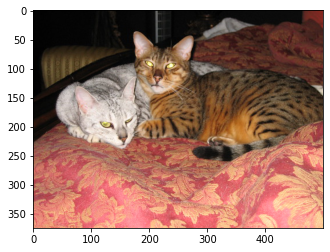

In [8]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [9]:
output = resn(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077121 10.977325 10.554378]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

![Grad-CAM](https://da2so.github.io/assets/post_img/2020-08-10-GradCAM/2.png)

In [18]:
class Custom_Grad_CAM():
  def __init__(self, model):
    self.model = model
    self.device = next(model.parameters()).device
    self.fhooks = {}
    self.bhooks = {}
    self.hooks = [] 

    # Called by the forward hooks to map each layer module to forward mapsp
    def save_fmaps(key):
        def forward_hook(module, input, output):
            self.fhooks[key] = output.detach()
        return forward_hook
    
    # Called by the backward hooks to map each layer module to gradient
    def save_grads(key):
        def backward_hook(module, grad_in, grad_out):
            self.bhooks[key] = grad_out[0].detach()
        return backward_hook

    # iterates through the modules 
    for name, module in self.model.named_modules():
        self.hooks.append(module.register_forward_hook(save_fmaps(name)))
        self.hooks.append(module.register_backward_hook(save_grads(name)))
        
  # Applies the multiplication of fmaps to weights in gradient (as per paper)
  def generate(self, target_layer):
    fmaps = self.fhooks[target_layer]
    grads = self.bhooks[target_layer]
    weights = F.adaptive_avg_pool2d(grads, (1,1))
    gcam = torch.mul(fmaps, weights).sum(dim=1, keepdim=True)
    gcam = F.relu(gcam)
    gcam = F.interpolate(gcam, self.image_shape, mode="bilinear", align_corners=False)

    B, C, H, W = gcam.shape
    gcam = gcam.view(B, -1)
    gcam -= gcam.min(dim=1, keepdim=True)[0]
    gcam /= gcam.max(dim=1, keepdim=True)[0]
    gcam = gcam.view(B, C, H, W)

    return gcam  #an image region
 
  # Used to create our heatmap
  def g_CAM(self, img, output, category, image_index): 
    ids_ = torch.LongTensor([[category]] * len(images))
    self.backward(ids=ids_)

    regions = self.generate("layer4") # last layer

    image_region = regions[image_index, 0].numpy()
    cmap = cm.jet_r(image_region)[..., :3] * 255.0
    alpha = image_region[..., None]
    image_region = alpha * cmap + (1 - alpha) * img 
    return Image.fromarray(np.uint8(image_region))

  # Run our resnet model on the image
  def forward(self, image):
      self.image_shape = image.shape[2:]
      self.logits = self.model(image)
      self.probs = F.softmax(self.logits, dim=1)
      return self.probs.sort(dim=1, descending=True)

  # Called by g_CAM because we must backprop for each class 
  def backward(self, ids):
      one_hot = torch.zeros_like(self.logits).to(self.device)
      one_hot.scatter_(1, ids, 1.0)
      self.model.zero_grad()
      self.logits.backward(gradient=one_hot, retain_graph=True)

In [19]:
# Create an instance of our grad cam model based on resnet
# and apply it to the images
cg = Custom_Grad_CAM(resn)
_ = cg.forward(images);

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [20]:
inverse_transforms = transforms.Compose([
        transforms.Normalize([0., 0., 0.], [1/0.229, 1/0.224, 1/0.225]),
        transforms.Normalize([-0.485, -0.456, -0.406], [1., 1., 1.]),
        transforms.ToPILImage()])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


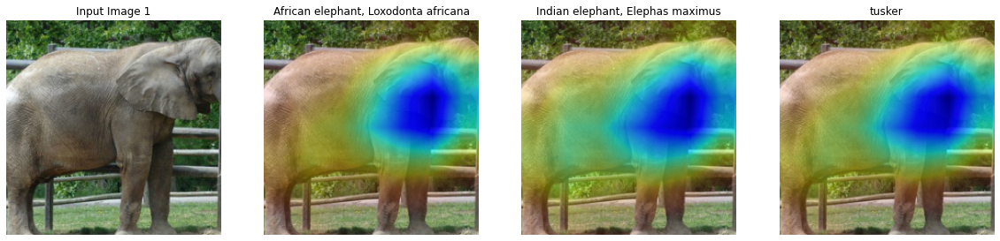

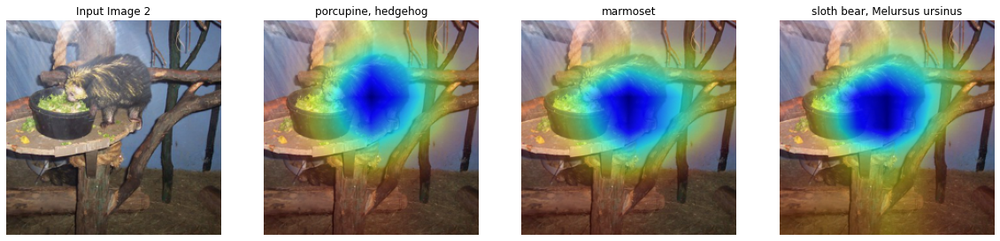

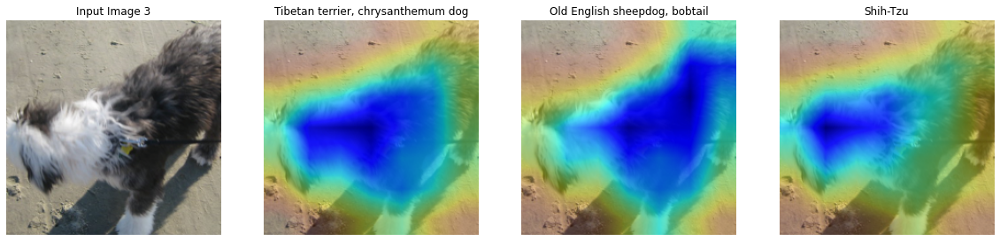

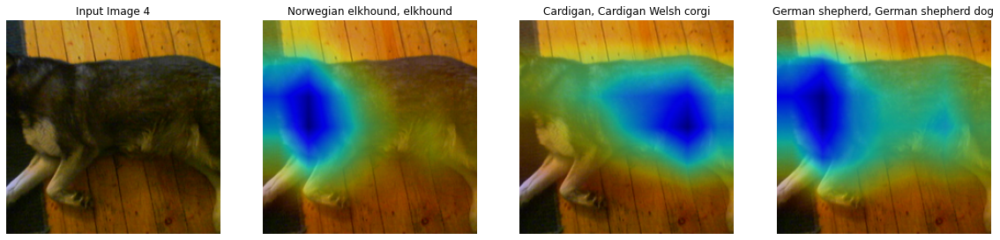

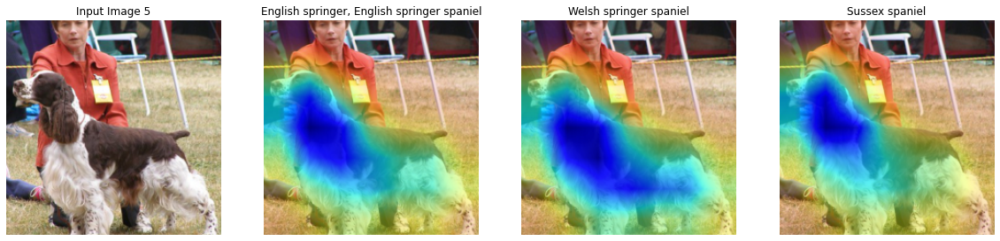

...

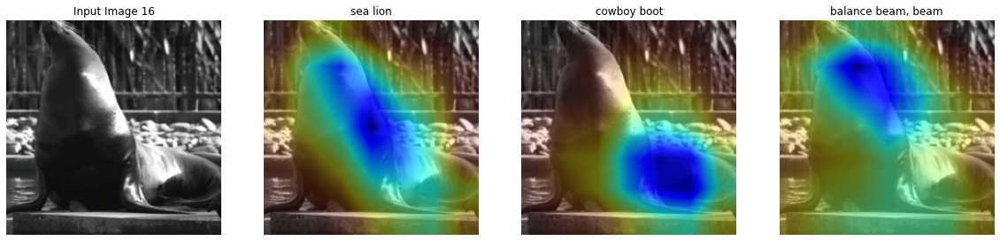

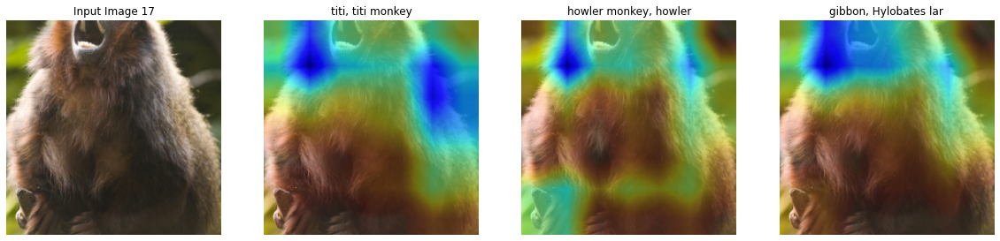

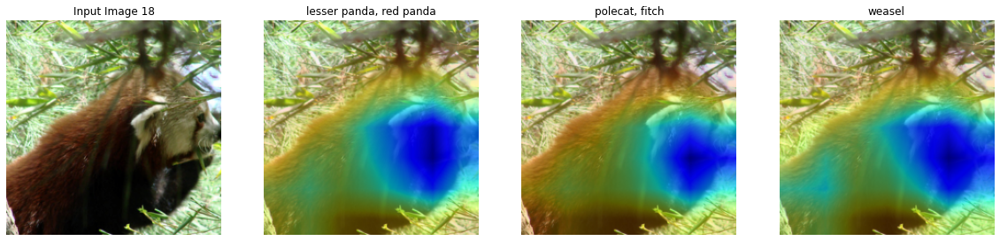

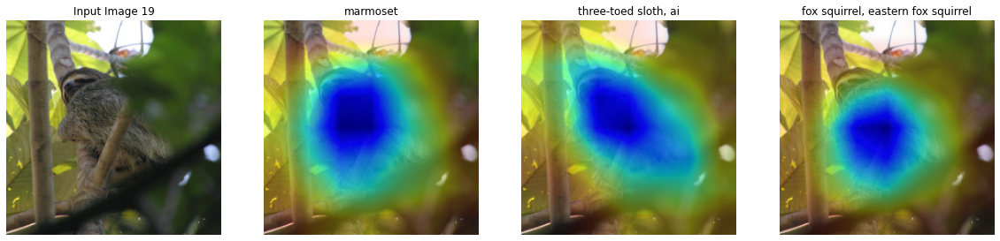

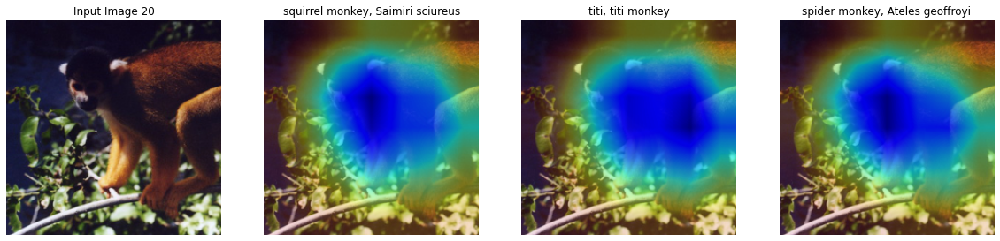

In [21]:
# Iterate through images in our dataset
# find the Grad Cam representation of top 3 classifications
for index in range(len(dataset)):
    img = dataset[index][0]
    output = resn(img.view(1, 3, 224, 224))
    _, idx = torch.topk(output, 3)
    categories = [classes[x] for x in idx[0].numpy()]

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.title(f"Input Image {index + 1}")
    img = inverse_transforms(img)
    plt.imshow(img)
    plt.axis('off')

    for i, category in enumerate(categories):
        grad_cam_heat_map = cg.g_CAM(img, output, 
                               idx[0][i], index)

        title_elements = category.split(", ")
        if len(title_elements) >= 2: 
          category = title_elements[0] + ", " + title_elements[1]

        plt.subplot(1, 4, i+2)
        plt.title(category)
        plt.imshow(grad_cam_heat_map)
        plt.axis('off')
    plt.show()

In [22]:
#Takes ~7 Min to run without GPU; 20 seconds per image